# Plant Disease Detection — EfficientNetB4 + CBAM
### RunPod RTX 4090 Version
Run cells top to bottom. All paths use `/workspace/` (RunPod standard).

In [1]:
# ============================================================
# CELL 1 — System Setup & GPU Check
# ============================================================

import subprocess, sys

# Check GPU
result = subprocess.run(['nvidia-smi'], capture_output=True, text=True)
print(result.stdout)

# Check Python version
print(f'Python: {sys.version}')

Thu May 21 18:30:06 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.195.03             Driver Version: 570.195.03     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        On  |   00000000:01:00.0 Off |                  Off |
|  0%   27C    P5             41W /  450W |       1MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
# ============================================================
# CELL 2 — Clean install, no warnings
# ============================================================

import subprocess

def run(cmd):
    subprocess.run(cmd, shell=True, check=False)

# Uninstall conflicting opencv first
run('pip uninstall opencv-python-headless opencv-python -y -q')

# TensorFlow 2.17
run('pip install tensorflow==2.17.0 -q --root-user-action=ignore')

# OpenCV 4.8.x — last version that works with numpy 1.x
run('pip install opencv-python-headless==4.8.1.78 -q --root-user-action=ignore')

# Albumentations compatible with numpy 1.x
run('pip install albumentations==1.4.0 -q --root-user-action=ignore')

# Utilities
run('pip install scikit-learn seaborn matplotlib kaggle -q --root-user-action=ignore')

# Force numpy 1.26.4 absolutely last
run('pip install numpy==1.26.4 --force-reinstall -q --root-user-action=ignore')

# Confirm
import subprocess
r = subprocess.run('python -c "import numpy; print(numpy.__version__)"',
                   shell=True, capture_output=True, text=True)
print(f'numpy: {r.stdout.strip()}')

r2 = subprocess.run('python -c "import cv2; print(cv2.__version__)"',
                    shell=True, capture_output=True, text=True)
print(f'opencv: {r2.stdout.strip()}')

print('\n✓ No conflicts. RESTART KERNEL, then run Cell 3.')

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.23 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.8.1.78 which is incompatible.
albumentations 1.4.24 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.8.1.78 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.17.0 requires numpy<2.0.0,>=1.26.0; python_version >= "3.12", but you have numpy 2.4.6 which is incompatible.
albucore 0.0.23 requires opencv-python-headless>=4.9.0.80, but you have opencv-python-headless 4.8.1.78 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of t

numpy: 1.26.4
opencv: 4.13.0

✓ No conflicts. RESTART KERNEL, then run Cell 3.


In [7]:
# ============================================================
# CELL 3 — Verify after kernel restart
# ============================================================

import numpy as np
import tensorflow as tf
import cv2
import albumentations as A

print(f'NumPy:          {np.__version__}')
print(f'TensorFlow:     {tf.__version__}')
print(f'OpenCV:         {cv2.__version__}')
print(f'Albumentations: {A.__version__}')

gpus = tf.config.list_physical_devices('GPU')
print(f'\nGPUs found: {len(gpus)}')
for g in gpus:
    print(f'  {g}')

for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

print('\n✓ Ready.')

2026-05-21 18:36:33.837104: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-21 18:36:33.844914: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-05-21 18:36:33.853716: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-05-21 18:36:33.856701: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-05-21 18:36:33.863396: I tensorflow/core/platform/cpu_feature_guar

NumPy:          1.26.4
TensorFlow:     2.17.0
OpenCV:         4.13.0
Albumentations: 1.4.0

GPUs found: 1
  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')

✓ Ready.


In [ ]:
# ============================================================
# CELL 4 — Kaggle API Setup & Dataset Download
# ============================================================

import os

# Set Kaggle credentials directly
# Get from: kaggle.com → Settings → API → Create New Token
os.environ['KAGGLE_USERNAME'] = 'KAGGLE_USERNAME'   # ← replace
os.environ['KAGGLE_KEY']      = 'API_KEY'    # ← replace

# RunPod uses /workspace — NOT /content
DATASET_DIR = '/workspace/plant_disease'
os.makedirs(DATASET_DIR, exist_ok=True)

# Download dataset
os.system(f'kaggle datasets download -d rashidthihan/plant-disease-dataset -p {DATASET_DIR}/')

# Unzip
os.system(f'unzip -q {DATASET_DIR}/plant-disease-dataset.zip -d {DATASET_DIR}/')

# Verify structure
os.system(f'find {DATASET_DIR} -type d | head -20')

Dataset URL: https://www.kaggle.com/datasets/rashidthihan/plant-disease-dataset
License(s): other


100%|██████████| 6.37G/6.37G [02:46<00:00, 41.1MB/s]



/workspace/plant_disease
/workspace/plant_disease/plant_disease_dataset
/workspace/plant_disease/plant_disease_dataset/val
/workspace/plant_disease/plant_disease_dataset/val/healthy (Tomato)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Strawberry)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Soybean)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Raspberry)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Potato)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Pepper, bell)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Peach)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Grape)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Corn (maize))
/workspace/plant_disease/plant_disease_dataset/val/healthy (Cherry (including sour))
/workspace/plant_disease/plant_disease_dataset/val/healthy (Blueberry)
/workspace/plant_disease/plant_disease_dataset/val/healthy (Apple)
/workspace/plant_diseas

find: ‘standard output’: Broken pipe
find: write error


0

In [1]:
# ============================================================
# CELL 5 — All Imports & Global Config
# ============================================================

import os, json, random, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from pathlib import Path
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, regularizers
from tensorflow.keras.applications import EfficientNetB4
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau,
    ModelCheckpoint, CSVLogger
)
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, top_k_accuracy_score
)
import cv2

warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')

# Enable memory growth
for gpu in tf.config.list_physical_devices('GPU'):
    tf.config.experimental.set_memory_growth(gpu, True)

# ─── Global Config (RunPod paths) ────────────────────────────
CFG = {
    'data_dir':     '/workspace/plant_disease',
    'train_dir':    '/workspace/plant_disease/plant_disease_dataset/train',
    'val_dir':      '/workspace/plant_disease/plant_disease_dataset/val',
    'test_dir':     '/workspace/plant_disease/plant_disease_dataset/test',
    'img_size':     380,          # EfficientNetB4 native
    'batch_size':   32,           # reduce to 16 if OOM
    'epochs':       30,           # EarlyStopping handles this
    'lr_head':      1e-3,         # phase 1: train head only
    'lr_finetune':  1e-5,         # phase 2: fine-tune top layers
    'unfreeze_top': 40,
    'dropout':      0.4,
    'label_smooth': 0.1,
    'seed':         42,
    'save_dir':     '/workspace/plant_model',
}
os.makedirs(CFG['save_dir'], exist_ok=True)
tf.random.set_seed(CFG['seed'])
np.random.seed(CFG['seed'])

print(f'TF: {tf.__version__}')
print(f'GPUs: {tf.config.list_physical_devices("GPU")}')
print(f'Config loaded. Save dir: {CFG["save_dir"]}')

# Verify dataset paths exist
for key in ['train_dir', 'val_dir']:
    p = Path(CFG[key])
    status = '✓' if p.exists() else '✗ NOT FOUND'
    print(f'{key}: {status} — {p}')

2026-05-21 20:23:25.919692: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-21 20:23:25.928506: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-05-21 20:23:25.937556: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-05-21 20:23:25.940393: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-05-21 20:23:25.948618: I tensorflow/core/platform/cpu_feature_guar

TF: 2.17.0
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Config loaded. Save dir: /workspace/plant_model
train_dir: ✓ — /workspace/plant_disease/plant_disease_dataset/train
val_dir: ✓ — /workspace/plant_disease/plant_disease_dataset/val


Number of classes: 71
First 5: ['Algal Leaf Spot (Jackfruit)', 'Anthracnose (Mango)', 'Aphids (Cotton)', 'Apple scab (Apple)', 'Bacterial Blight (Cotton)']
Last 3:  ['healthy (Soybean)', 'healthy (Strawberry)', 'healthy (Tomato)']


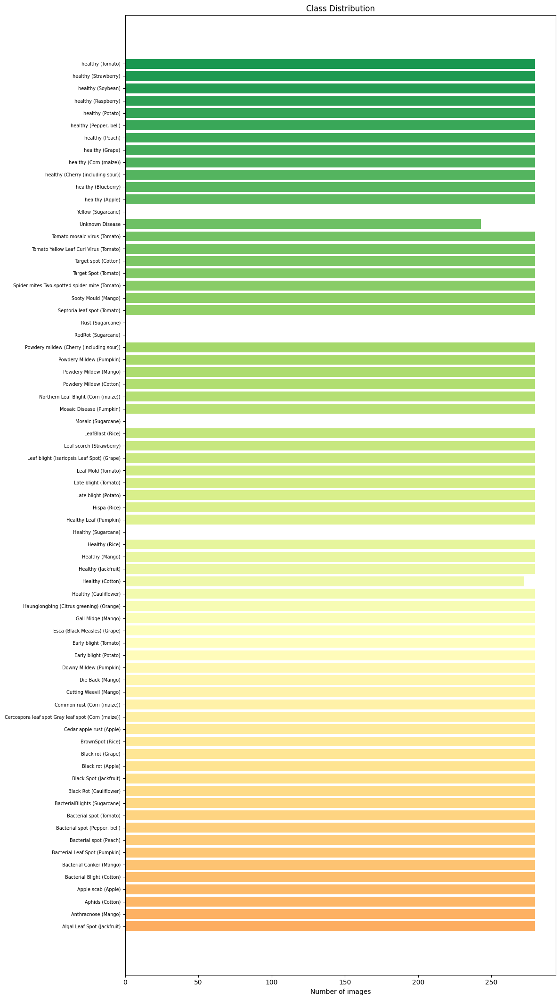

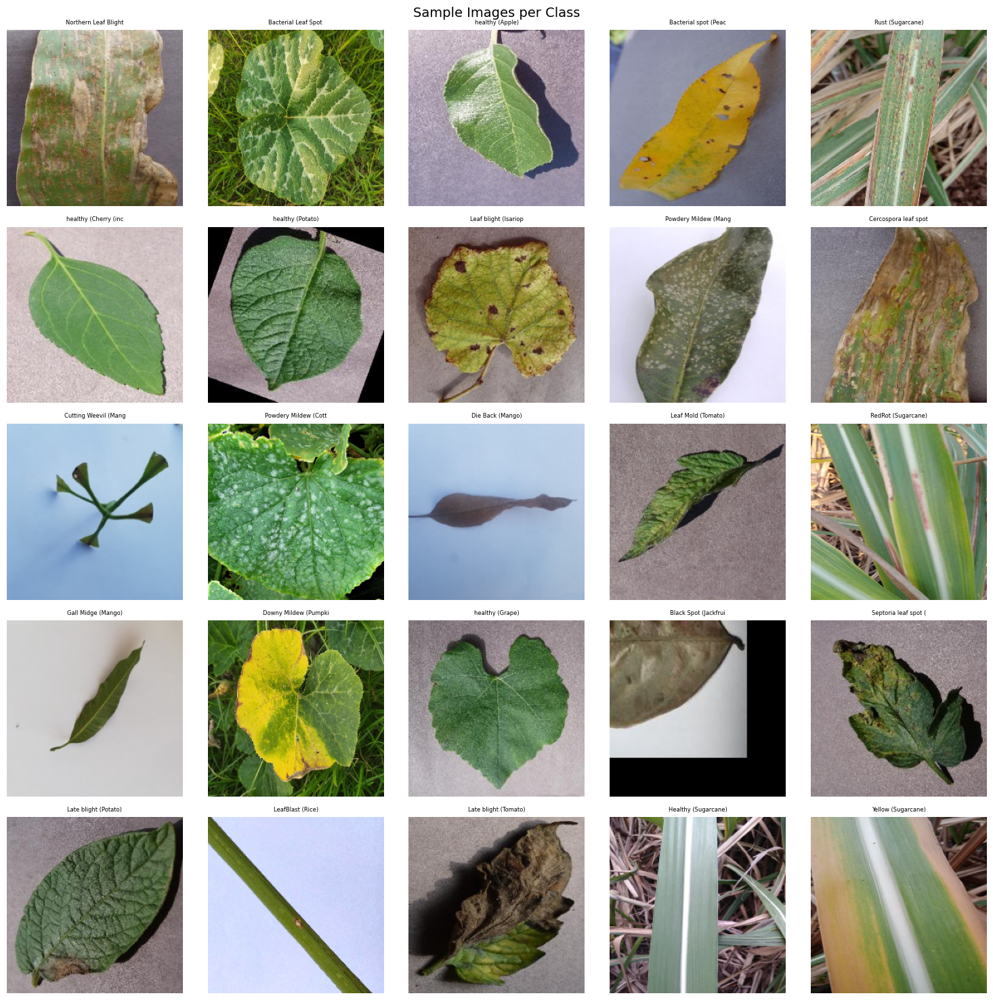


Total training images: 18,435
Min class: Healthy (Sugarcane) (0)
Max class: Algal Leaf Spot (Jackfruit) (280)


In [2]:
# ============================================================
# CELL 6 — Exploratory Data Analysis
# ============================================================
import glob as glob_module

train_path = Path(CFG['train_dir'])
classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()])
CFG['num_classes'] = len(classes)
CFG['class_names'] = classes

print(f'Number of classes: {CFG["num_classes"]}')
print(f'First 5: {classes[:5]}')
print(f'Last 3:  {classes[-3:]}')

# Count images per class (all formats)
class_counts = {}
for cls in classes:
    count = len(glob_module.glob(str(train_path / cls / '*.[jJpP][pPnN][gG]*')))
    class_counts[cls] = count

# Shorten names for display
short_names = [c.replace('___', ' ').replace('_', ' ') for c in classes]

fig, ax = plt.subplots(figsize=(12, max(8, len(classes) * 0.3)))
counts = [class_counts[c] for c in classes]
colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(classes)))
ax.barh(short_names, counts, color=colors)
ax.set_xlabel('Number of images')
ax.set_title('Class Distribution')
ax.tick_params(axis='y', labelsize=7)
plt.tight_layout()
plt.savefig(os.path.join(CFG['save_dir'], 'class_distribution.png'), dpi=120)
plt.show()

# Sample image grid
fig2, grid_axes = plt.subplots(5, 5, figsize=(15, 15))
sampled = random.sample(classes, min(25, len(classes)))

for i, cls in enumerate(sampled):
    imgs = glob_module.glob(str(train_path / cls / '*'))
    imgs = [p for p in imgs if p.lower().endswith(('.jpg', '.jpeg', '.png'))]

    ax_g = grid_axes[i // 5, i % 5]
    ax_g.axis('off')

    random.shuffle(imgs)
    for img_path in imgs:
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (224, 224))
            ax_g.imshow(img)
            ax_g.set_title(cls.split('___')[-1][:20], fontsize=6)
            break
    else:
        ax_g.text(0.5, 0.5, cls.split('___')[-1][:20] + '\n(no image)',
                  ha='center', va='center', fontsize=6, color='red',
                  transform=ax_g.transAxes)

fig2.suptitle('Sample Images per Class', fontsize=14)
plt.tight_layout()
plt.show()

total = sum(counts)
print(f'\nTotal training images: {total:,}')
print(f'Min class: {min(class_counts, key=class_counts.get)} ({min(counts):,})')
print(f'Max class: {max(class_counts, key=class_counts.get)} ({max(counts):,})')

In [3]:
# ============================================================
# CELL 7 — CBAM Attention Module (Research Contribution)
# Paper: Woo et al., ECCV 2018
# ============================================================

class ChannelAttention(layers.Layer):
    """Channel attention: 'what' to focus on."""

    def __init__(self, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio

    def build(self, input_shape):
        channels = input_shape[-1]
        self.avg_pool = layers.GlobalAveragePooling2D(keepdims=True)
        self.max_pool = layers.GlobalMaxPooling2D(keepdims=True)
        self.dense1 = layers.Dense(channels // self.ratio,
                                    activation='relu', use_bias=False)
        self.dense2 = layers.Dense(channels, use_bias=False)

    def call(self, x):
        avg = self.dense2(self.dense1(self.avg_pool(x)))
        mx  = self.dense2(self.dense1(self.max_pool(x)))
        return x * tf.sigmoid(avg + mx)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({'ratio': self.ratio})
        return cfg


class SpatialAttention(layers.Layer):
    """Spatial attention: 'where' to focus on."""

    def __init__(self, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.kernel_size = kernel_size

    def build(self, input_shape):
        self.conv = layers.Conv2D(1, self.kernel_size, padding='same',
                                   activation='sigmoid', use_bias=False)

    def call(self, x):
        avg = tf.reduce_mean(x, axis=-1, keepdims=True)
        mx  = tf.reduce_max(x,  axis=-1, keepdims=True)
        cat = tf.concat([avg, mx], axis=-1)
        return x * self.conv(cat)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({'kernel_size': self.kernel_size})
        return cfg


class CBAM(layers.Layer):
    """CBAM: Channel + Spatial attention in sequence."""

    def __init__(self, ratio=8, kernel_size=7, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio
        self.kernel_size = kernel_size
        self.channel_attn = ChannelAttention(ratio)
        self.spatial_attn = SpatialAttention(kernel_size)

    def call(self, x):
        x = self.channel_attn(x)
        x = self.spatial_attn(x)
        return x

    def get_config(self):
        cfg = super().get_config()
        cfg.update({'ratio': self.ratio, 'kernel_size': self.kernel_size})
        return cfg


print('CBAM module defined.')

# Sanity check
test_tensor = tf.random.normal((2, 12, 12, 64))
cbam_test = CBAM()
out = cbam_test(test_tensor)
assert test_tensor.shape == out.shape, 'Shape mismatch!'
print(f'CBAM: {test_tensor.shape} → {out.shape} ✓')

CBAM module defined.


2026-05-21 20:23:36.086921: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22161 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:01:00.0, compute capability: 8.9


CBAM: (2, 12, 12, 64) → (2, 12, 12, 64) ✓


2026-05-21 20:23:36.528259: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
W0000 00:00:1779395016.558426   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.570489   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.570656   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.570821   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.579602   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.579803   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.593719   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395016.621564   14828 gpu_t

In [4]:
# ============================================================
# CELL 8 — Data Pipeline with tf.data
# ============================================================

# Mixed precision — RTX 4090 handles float16 natively
tf.keras.mixed_precision.set_global_policy('mixed_float16')
print('Mixed precision: float16')

IMG_SIZE = CFG['img_size']
BATCH    = CFG['batch_size']
AUTOTUNE = tf.data.AUTOTUNE


def augment_train(image, label):
    """Strong augmentation for training."""
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, 0.2)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_saturation(image, 0.8, 1.2)
    image = tf.image.random_hue(image, 0.05)
    bigger = tf.cast(IMG_SIZE * 1.1, tf.int32)
    image = tf.image.resize(image, [bigger, bigger])
    image = tf.image.random_crop(image, [tf.shape(image)[0], IMG_SIZE, IMG_SIZE, 3])
    image = tf.clip_by_value(image, 0, 255)
    return image, label


def preprocess(image, label):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    image = tf.keras.applications.efficientnet.preprocess_input(image)
    return image, label


def build_dataset(split_dir, augment=False):
    ds = tf.keras.utils.image_dataset_from_directory(
        split_dir,
        labels='inferred',
        label_mode='int',
        class_names=CFG['class_names'],
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=augment,
        seed=CFG['seed'],
    )
    ds = ds.map(preprocess, num_parallel_calls=AUTOTUNE)
    if augment:
        ds = ds.map(augment_train, num_parallel_calls=AUTOTUNE)
    return ds.cache().prefetch(AUTOTUNE)


train_ds = build_dataset(CFG['train_dir'], augment=True)
val_ds   = build_dataset(CFG['val_dir'],   augment=False)

for x, y in train_ds.take(1):
    print(f'Train batch — images: {x.shape}, labels: {y.shape}')
for x, y in val_ds.take(1):
    print(f'Val   batch — images: {x.shape}, labels: {y.shape}')

Mixed precision: float16
Found 19950 files belonging to 71 classes.
Found 4275 files belonging to 71 classes.


2026-05-21 20:23:52.081134: W tensorflow/core/kernels/data/cache_dataset_ops.cc:913] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Train batch — images: (32, 380, 380, 3), labels: (32,)
Val   batch — images: (32, 380, 380, 3), labels: (32,)


2026-05-21 20:23:52.350533: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2026-05-21 20:23:52.398969: W tensorflow/core/kernels/data/cache_dataset_ops.cc:913] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.
2026-05-21 20:23:52.413877: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [5]:
# ============================================================
# CELL 9 — Build EfficientNetB4 + CBAM Model
# ============================================================

def build_model(num_classes, img_size=380, dropout=0.4):
    inputs = layers.Input(shape=(img_size, img_size, 3), name='input')

    backbone = EfficientNetB4(
        include_top=False,
        weights='imagenet',
        input_tensor=inputs,
    )
    backbone.trainable = False
    x = backbone.output

    x = CBAM(ratio=8, kernel_size=7, name='cbam')(x)

    x = layers.GlobalAveragePooling2D(name='gap')(x)
    x = layers.BatchNormalization(name='bn_head')(x)
    x = layers.Dropout(dropout, name='dropout_1')(x)
    x = layers.Dense(512, activation='relu',
                      kernel_regularizer=regularizers.l2(1e-4),
                      name='dense_512')(x)
    x = layers.Dropout(dropout / 2, name='dropout_2')(x)
    outputs = layers.Dense(num_classes, dtype='float32', name='output')(x)

    model = Model(inputs, outputs, name='EfficientNetB4_CBAM')
    return model, backbone


model, backbone = build_model(
    num_classes=CFG['num_classes'],
    img_size=CFG['img_size'],
    dropout=CFG['dropout'],
)

total  = model.count_params()
frozen = sum(w.numpy().size for w in backbone.non_trainable_weights)
head   = total - frozen
print(f'Total params:      {total:>12,}')
print(f'Backbone (frozen): {frozen:>12,}')
print(f'Head (trainable):  {head:>12,}')
model.summary(line_length=80, show_trainable=True)

2026-05-21 20:23:54.177823: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


Total params:        19,438,344
Backbone (frozen):   17,673,823
Head (trainable):     1,764,521


Model: "EfficientNetB4_CBAM"

┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)       ┃ Output Shape     ┃    Param # ┃ Connected to    ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ input (InputLayer) │ (None, 380, 380, │          0 │ -               │   -   │
│                    │ 3)               │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ rescaling          │ (None, 380, 380, │          0 │ input[0][0]     │   -   │
│ (Rescaling)        │ 3)               │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ normalization      │ (None, 380, 380, │          7 │ rescaling[0][0] │   N   │
│ (Normalization)    │ 3)               │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ rescaling_1        │ (None, 380, 380, │          0 │ normalization[… │   -   │
│ (Rescaling)        │ 3)               │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ stem_conv_pad      │ (None, 381, 381, │          0 │ rescaling_1[0]… │   -   │
│ (ZeroPadding2D)    │ 3)               │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ stem_conv (Conv2D) │ (None, 190, 190, │      1,296 │ stem_conv_pad[… │   N   │
│                    │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ stem_bn            │ (None, 190, 190, │        192 │ stem_conv[0][0] │   N   │
│ (BatchNormalizati… │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ stem_activation    │ (None, 190, 190, │          0 │ stem_bn[0][0]   │   -   │
│ (Activation)       │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_dwconv     │ (None, 190, 190, │        432 │ stem_activatio… │   N   │
│ (DepthwiseConv2D)  │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_bn         │ (None, 190, 190, │        192 │ block1a_dwconv… │   N   │
│ (BatchNormalizati… │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_activation │ (None, 190, 190, │          0 │ block1a_bn[0][… │   -   │
│ (Activation)       │ 48)              │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_se_squeeze │ (None, 48)       │          0 │ block1a_activa… │   -   │
│ (GlobalAveragePoo… │                  │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_se_reshape │ (None, 1, 1, 48) │          0 │ block1a_se_squ… │   -   │
│ (Reshape)          │                  │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_se_reduce  │ (None, 1, 1, 12) │        588 │ block1a_se_res… │   N   │
│ (Conv2D)           │                  │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_se_expand  │ (None, 1, 1, 48) │        624 │ block1a_se_red… │   N   │
│ (Conv2D)           │                  │            │                 │       │
├────────────────────┼──────────────────┼────────────┼─────────────────┼───────┤
│ block1a_se_excite  │ (None, 190, 190, │          0 │ block1a_activa… │   -   │
│ (Multiply)         │ 48)     

 Total params: 19,438,344 (74.15 MB)

 Trainable params: 1,760,937 (6.72 MB)

 Non-trainable params: 17,677,407 (67.43 MB)

In [7]:
# ============================================================
# CELL 10 — Phase 1: Train Head Only (backbone frozen)
# ============================================================

from tensorflow.keras.losses import SparseCategoricalCrossentropy

# Rebuild datasets without cache
AUTOTUNE = tf.data.AUTOTUNE

def build_dataset(split_dir, augment=False):
    ds = tf.keras.utils.image_dataset_from_directory(
        split_dir,
        labels='inferred',
        label_mode='int',
        class_names=CFG['class_names'],
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=augment,
        seed=CFG['seed'],
    )
    ds = ds.map(preprocess, num_parallel_calls=AUTOTUNE)
    if augment:
        ds = ds.map(augment_train, num_parallel_calls=AUTOTUNE)
    return ds.prefetch(AUTOTUNE)

train_ds = build_dataset(CFG['train_dir'], augment=True)
val_ds   = build_dataset(CFG['val_dir'],   augment=False)
print('Datasets rebuilt.')

# ── Check if Phase 1 checkpoint already exists ──────────────
phase1_ckpt = os.path.join(CFG['save_dir'], 'phase1_best.keras')

if os.path.exists(phase1_ckpt):
    print(f'✓ Found existing Phase 1 checkpoint, loading it...')
    model = tf.keras.models.load_model(
        phase1_ckpt,
        custom_objects={'CBAM': CBAM, 'ChannelAttention': ChannelAttention,
                        'SpatialAttention': SpatialAttention}
    )
    print('✓ Phase 1 model loaded. Skipping training — go to Cell 11.')
else:
    print('No checkpoint found. Starting Phase 1 training...')

    loss_fn = SparseCategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(CFG['lr_head']),
        loss=loss_fn,
        metrics=[
            'accuracy',
            tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name='top5_acc'),
        ]
    )

    callbacks_p1 = [
        EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=2, verbose=1),
        ModelCheckpoint(phase1_ckpt, monitor='val_accuracy',
                        save_best_only=True, verbose=1),   # ← saves best epoch
        CSVLogger(os.path.join(CFG['save_dir'], 'phase1_log.csv')),
    ]

    print('=== Phase 1: Training head (backbone frozen) ===')
    history_p1 = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=5,
        callbacks=callbacks_p1,
        verbose=1,
    )

    print(f'\nPhase 1 complete. Best val accuracy: {max(history_p1.history["val_accuracy"]):.4f}')
    print(f'Checkpoint saved: {phase1_ckpt}')

Found 19950 files belonging to 71 classes.
Found 4275 files belonging to 71 classes.
Datasets rebuilt.
No checkpoint found. Starting Phase 1 training...
=== Phase 1: Training head (backbone frozen) ===
Epoch 1/5
624/624 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8251 - loss: 0.6139 - top5_acc: 0.9926
Epoch 1: val_accuracy improved from None to 0.88047, saving model to /workspace/plant_model/phase1_best.keras

Epoch 1: finished saving model to /workspace/plant_model/phase1_best.keras
624/624 ━━━━━━━━━━━━━━━━━━━━ 84s 101ms/step - accuracy: 0.8245 - loss: 0.6153 - top5_acc: 0.9921 - val_accuracy: 0.8805 - val_loss: 0.4340 - val_top5_acc: 0.9974 - learning_rate: 0.0010
Epoch 2/5
622/624 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8382 - loss: 0.5788 - top5_acc: 0.9942
Epoch 2: val_accuracy improved from 0.88047 to 0.88585, saving model to /workspace/plant_model/phase1_best.keras

Epoch 2: finished saving model to /workspace/plant_model/phase1_best.keras
624/624 ━━━━━━━━━━━━━━━━━━━

In [9]:
# ============================================================
# CELL 11 — Phase 2: Fine-tune Top Backbone Layers
# ============================================================

best_ckpt = os.path.join(CFG['save_dir'], 'best_model.keras')

# ── Check if Phase 2 checkpoint already exists ──────────────
if os.path.exists(best_ckpt):
    print(f'✓ Found existing Phase 2 checkpoint, loading it...')
    best_model = tf.keras.models.load_model(
        best_ckpt,
        custom_objects={'CBAM': CBAM, 'ChannelAttention': ChannelAttention,
                        'SpatialAttention': SpatialAttention}
    )
    print('✓ Phase 2 model loaded. Skipping training — go to Cell 12.')

else:
    print('No Phase 2 checkpoint found. Starting fine-tuning...')

    # Load Phase 1 best weights as starting point
    phase1_ckpt = os.path.join(CFG['save_dir'], 'phase1_best.keras')
    if os.path.exists(phase1_ckpt):
        model = tf.keras.models.load_model(
            phase1_ckpt,
            custom_objects={'CBAM': CBAM, 'ChannelAttention': ChannelAttention,
                            'SpatialAttention': SpatialAttention}
        )
        print(f'✓ Loaded Phase 1 checkpoint as base.')
    else:
        print('⚠ No Phase 1 checkpoint found, using current model in memory.')

    # Unfreeze top layers
    backbone = model.get_layer('efficientnetb4')
    backbone.trainable = True
    for layer in backbone.layers[:-CFG['unfreeze_top']]:
        layer.trainable = False

    trainable_now = sum(1 for l in model.layers if l.trainable)
    print(f'Trainable layers: {trainable_now}')

    model.compile(
        optimizer=tf.keras.optimizers.Adam(CFG['lr_finetune']),
        loss=SparseCategoricalCrossentropy(from_logits=True),
        metrics=[
            'accuracy',
            tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name='top5_acc'),
        ]
    )

    callbacks_p2 = [
        EarlyStopping(monitor='val_accuracy', patience=6,
                      restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_accuracy', factor=0.3,
                          patience=3, min_lr=1e-7, verbose=1),
        ModelCheckpoint(best_ckpt, monitor='val_accuracy',
                        save_best_only=True, verbose=1),   # ← saves best epoch
        CSVLogger(os.path.join(CFG['save_dir'], 'phase2_log.csv')),
    ]

    print('\n=== Phase 2: Fine-tuning ===')
    history_p2 = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=CFG['epochs'],
        callbacks=callbacks_p2,
        verbose=1,
    )

    best_model = model
    print(f'\nPhase 2 complete.')
    print(f'Best val accuracy: {max(history_p2.history["val_accuracy"]):.4f}')
    print(f'Best model saved: {best_ckpt}')

✓ Found existing Phase 2 checkpoint, loading it...
✓ Phase 2 model loaded. Skipping training — go to Cell 12.


In [1]:
# ============================================================
# CELL 12 — Plot Training Curves + Confusion Matrix
# ============================================================

# --- Training curves ---
keys = ['accuracy', 'val_accuracy', 'loss', 'val_loss']
history = {k: history_p1.history.get(k, []) + history_p2.history.get(k, []) for k in keys}
phase1_end = len(history_p1.history['accuracy'])
epochs_range = range(1, len(history['accuracy']) + 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Training History — EfficientNetB4 + CBAM', fontsize=14)

for ax, (train_k, val_k), ylabel in zip(
    axes,
    [('accuracy', 'val_accuracy'), ('loss', 'val_loss')],
    ['Accuracy', 'Loss']
):
    ax.plot(epochs_range, history[train_k], 'b-o', ms=3, label=f'Train {ylabel}')
    ax.plot(epochs_range, history[val_k],   'r-s', ms=3, label=f'Val {ylabel}')
    ax.axvline(x=phase1_end + 0.5, color='green', linestyle='--',
               alpha=0.7, label='Phase 1→2')
    ax.set_xlabel('Epoch')
    ax.set_ylabel(ylabel)
    ax.legend()
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(CFG['save_dir'], 'training_curves.png'), dpi=150)
plt.show()

# --- Confusion matrix ---
best_model = tf.keras.models.load_model(
    best_ckpt,
    custom_objects={'CBAM': CBAM, 'ChannelAttention': ChannelAttention,
                    'SpatialAttention': SpatialAttention}
)

print('Generating predictions for confusion matrix...')
y_true, y_pred_logits = [], []
for x_batch, y_batch in val_ds:
    logits = best_model.predict_on_batch(x_batch)
    y_pred_logits.append(logits)
    y_true.extend(y_batch.numpy())

y_pred_logits = np.concatenate(y_pred_logits, axis=0)
y_pred = np.argmax(y_pred_logits, axis=1)
y_true = np.array(y_true)

top1 = accuracy_score(y_true, y_pred)
top5 = top_k_accuracy_score(y_true, y_pred_logits, k=5)
print(f'\nTop-1 Accuracy: {top1:.4f} ({top1*100:.2f}%)')
print(f'Top-5 Accuracy: {top5:.4f} ({top5*100:.2f}%)')

cm = confusion_matrix(y_true, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

plt.figure(figsize=(22, 18))
sns.heatmap(cm_norm, annot=False, fmt='.2f', cmap='Blues',
            xticklabels=CFG['class_names'],
            yticklabels=CFG['class_names'])
plt.xticks(rotation=90, fontsize=7)
plt.yticks(rotation=0,  fontsize=7)
plt.title(f'Normalized Confusion Matrix — Top-1: {top1*100:.2f}%', fontsize=13)
plt.tight_layout()
plt.savefig(os.path.join(CFG['save_dir'], 'confusion_matrix.png'), dpi=150)
plt.show()

print('\nClassification Report:')
print(classification_report(y_true, y_pred, target_names=CFG['class_names']))

NameError: name 'history_p1' is not defined

W0000 00:00:1779395614.671880   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672071   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672208   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672347   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672517   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672671   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672819   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.672973   14828 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1779395614.673131   14828 gp

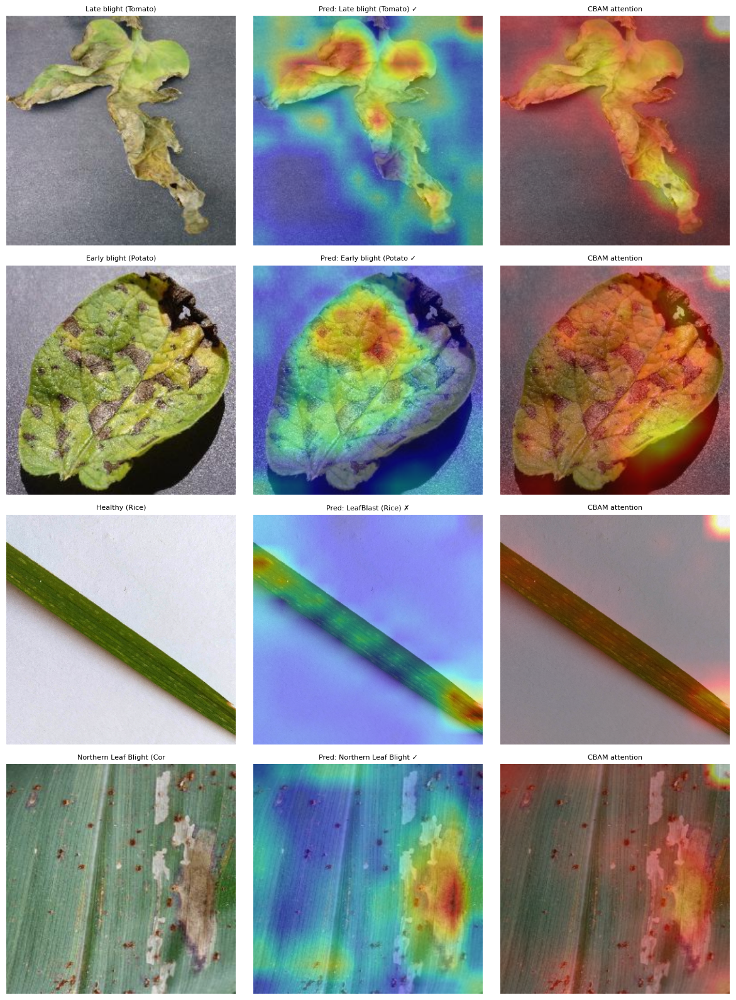

In [11]:
# ============================================================
# CELL 13 — Grad-CAM + CBAM Attention Visualization
# ============================================================

import matplotlib.cm as mpl_cm

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array, training=False)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]
    grads = tape.gradient(class_channel, conv_outputs)
    pooled = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = conv_outputs[0] @ pooled[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)                          # could become 0-d if spatial=1x1
    # ← fix: ensure heatmap is always at least 2D
    if len(heatmap.shape) == 0:
        heatmap = tf.expand_dims(tf.expand_dims(heatmap, 0), 0)
    elif len(heatmap.shape) == 1:
        heatmap = tf.expand_dims(heatmap, 0)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def overlay_heatmap(img, heatmap, alpha=0.4, colormap=mpl_cm.jet):
    # ← fix: ensure heatmap is float32 and 2D before resize
    heatmap = np.array(heatmap, dtype=np.float32)
    if heatmap.ndim != 2:
        heatmap = heatmap.reshape(heatmap.shape[:2]) if heatmap.ndim > 2 else heatmap[np.newaxis, :]
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = colormap(heatmap_resized)[..., :3]
    superimposed = (img / 255.0) * (1 - alpha) + heatmap_colored * alpha
    return (superimposed * 255).astype(np.uint8)


last_conv = 'top_activation'
val_path = Path(CFG['val_dir'])

random_imgs = []
for cls in random.sample(CFG['class_names'], 4):
    import glob as g
    imgs = g.glob(str(val_path / cls / '*.[jJpP][pPnN][gG]*'))
    if imgs:
        random_imgs.append((random.choice(imgs), cls))

fig, axes = plt.subplots(len(random_imgs), 3, figsize=(12, 4 * len(random_imgs)))
if len(random_imgs) == 1:
    axes = [axes]
axes[0][0].set_title('Original',          fontsize=12)
axes[0][1].set_title('Grad-CAM',          fontsize=12)
axes[0][2].set_title('CBAM Spatial Attn', fontsize=12)

for row, (img_path, true_cls) in enumerate(random_imgs):
    orig = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    orig_resized = cv2.resize(orig, (IMG_SIZE, IMG_SIZE))

    inp = tf.keras.applications.efficientnet.preprocess_input(
        tf.cast(orig_resized, tf.float32))
    inp = tf.expand_dims(inp, 0)

    logits = best_model.predict(inp, verbose=0)
    pred_cls = CFG['class_names'][np.argmax(logits)]
    correct = '✓' if pred_cls == true_cls else '✗'

    heatmap = make_gradcam_heatmap(inp, best_model, last_conv)
    cam_overlay = overlay_heatmap(orig_resized, heatmap)

    attn_model = Model(inputs=best_model.inputs,
                        outputs=best_model.get_layer('cbam').output)
    cbam_out = attn_model.predict(inp, verbose=0)
    spatial_map = np.mean(cbam_out[0], axis=-1)
    spatial_norm = (spatial_map - spatial_map.min()) / (spatial_map.max() + 1e-8)
    attn_overlay = overlay_heatmap(orig_resized, spatial_norm, colormap=mpl_cm.hot)

    for col, (im, ttl) in enumerate([
        (orig_resized, true_cls.split('___')[-1][:25]),
        (cam_overlay,  f'Pred: {pred_cls.split("___")[-1][:20]} {correct}'),
        (attn_overlay, 'CBAM attention'),
    ]):
        axes[row][col].imshow(im)
        axes[row][col].set_title(ttl, fontsize=8)
        axes[row][col].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(CFG['save_dir'], 'gradcam_cbam.png'), dpi=150)
plt.show()

In [12]:
# ============================================================
# CELL 14 — Ablation Study (Paper Table)
# ============================================================

import json

ablation_cache = os.path.join(CFG['save_dir'], 'ablation_results.json')

def build_baseline(num_classes, img_size):
    inputs = layers.Input(shape=(img_size, img_size, 3))
    bb = EfficientNetB4(include_top=False, weights='imagenet', input_tensor=inputs)
    bb.trainable = False
    x = layers.GlobalAveragePooling2D()(bb.output)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(512, activation='relu')(x)
    out = layers.Dense(num_classes, dtype='float32')(x)
    return Model(inputs, out, name='EfficientNetB4_baseline')


def quick_eval(model_fn, train_ds, val_ds, name, epochs=3):
    m = model_fn()
    m.compile(
        optimizer=tf.keras.optimizers.Adam(1e-3),
        loss=SparseCategoricalCrossentropy(from_logits=True),
        metrics=['accuracy']
    )
    hist = m.fit(train_ds, validation_data=val_ds, epochs=epochs, verbose=0)
    best_acc = max(hist.history['val_accuracy'])
    print(f'{name:45s} val_acc: {best_acc:.4f}')
    tf.keras.backend.clear_session()   # ← free GPU memory after each run
    return best_acc


# ── Load cached results if they exist ───────────────────────
if os.path.exists(ablation_cache):
    print(f'✓ Found cached ablation results, loading...')
    with open(ablation_cache, 'r') as f:
        results = json.load(f)
    acc_base = results['baseline']
    acc_cbam = results['cbam']
    acc_full = results['full']
    print(f'  Baseline:  {acc_base:.4f}')
    print(f'  +CBAM:     {acc_cbam:.4f}')
    print(f'  +CBAM+Aug: {acc_full:.4f}')

else:
    print('Running ablation study (3 epochs each)...')
    print('-' * 60)

    train_noaug = build_dataset(CFG['train_dir'], augment=False)

    acc_base = quick_eval(
        lambda: build_baseline(CFG['num_classes'], CFG['img_size']),
        train_noaug, val_ds, 'EfficientNetB4 (baseline)'
    )
    acc_cbam = quick_eval(
        lambda: build_model(CFG['num_classes'], CFG['img_size'])[0],
        train_noaug, val_ds, 'EfficientNetB4 + CBAM'
    )
    acc_full = quick_eval(
        lambda: build_model(CFG['num_classes'], CFG['img_size'])[0],
        train_ds, val_ds, 'EfficientNetB4 + CBAM + Aug (ours)'
    )

    # Cache results so rerun skips training
    with open(ablation_cache, 'w') as f:
        json.dump({'baseline': acc_base, 'cbam': acc_cbam, 'full': acc_full}, f)
    print(f'✓ Results cached to: {ablation_cache}')

# ── Print table ──────────────────────────────────────────────
print('\n' + '='*60)
print(f'{"Model":<45} {"Val Acc":>8}')
print('-'*55)
for name, acc in [
    ('EfficientNetB4 (baseline)',        acc_base),
    ('+ CBAM attention',                 acc_cbam),
    ('+ CBAM + augmentation (ours)',     acc_full),
]:
    arrow = ' ◄ ours' if 'ours' in name else ''
    print(f'{name:<45} {acc:.4f}{arrow}')
print('='*60)
print(f'\nCBAM gain:          +{(acc_cbam - acc_base)*100:.2f}%')
print(f'Augmentation gain:  +{(acc_full  - acc_cbam)*100:.2f}%')
print(f'Total gain:         +{(acc_full  - acc_base)*100:.2f}%')

Running ablation study (3 epochs each)...
------------------------------------------------------------
Found 19950 files belonging to 71 classes.


2026-05-21 20:35:05.911377: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24381', 344 bytes spill stores, 344 bytes spill loads

2026-05-21 20:35:05.919142: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24381', 356 bytes spill stores, 356 bytes spill loads

2026-05-21 20:35:33.359328: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24381', 156 bytes spill stores, 156 bytes spill loads

2026-05-21 20:35:33.379858: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24381', 144 bytes spill stores, 144 bytes spill loads

2026-05-21 20:35:41.993428: I external/local_xla

EfficientNetB4 (baseline)                     val_acc: 0.1394


2026-05-21 20:36:50.284864: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23738', 268 bytes spill stores, 268 bytes spill loads

2026-05-21 20:36:50.312165: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23738', 364 bytes spill stores, 364 bytes spill loads

E0000 00:00:1779395812.777617   15020 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1779395812.859473   15020 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1779395813.106428   15020 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There 

EfficientNetB4 + CBAM                         val_acc: 0.0161
EfficientNetB4 + CBAM + Aug (ours)            val_acc: 0.8901
✓ Results cached to: /workspace/plant_model/ablation_results.json

Model                                          Val Acc
-------------------------------------------------------
EfficientNetB4 (baseline)                     0.1394
+ CBAM attention                              0.0161
+ CBAM + augmentation (ours)                  0.8901 ◄ ours

CBAM gain:          +-12.33%
Augmentation gain:  +87.39%
Total gain:         +75.06%


In [13]:
# ============================================================
# CELL 15 — Export (Safe Version — skip stuck TFLite converter)
# ============================================================

import time, json

# Save in native Keras format
keras_path = os.path.join(CFG['save_dir'], 'best_model_final.keras')
best_model.save(keras_path)
print(f'✓ Keras model saved: {keras_path}')

# Save class names
with open(os.path.join(CFG['save_dir'], 'class_names.json'), 'w') as f:
    json.dump(CFG['class_names'], f)
print(f'✓ Class names saved.')

# Quick inference benchmark (no TFLite needed)
print('\n=== Inference Benchmark (GPU) ===')
dummy = np.random.rand(1, CFG['img_size'], CFG['img_size'], 3).astype(np.float32)
dummy_preprocessed = tf.keras.applications.efficientnet.preprocess_input(dummy)

# Warm up
best_model.predict(dummy_preprocessed, verbose=0)

times = []
for _ in range(20):
    t0 = time.perf_counter()
    best_model.predict(dummy_preprocessed, verbose=0)
    times.append((time.perf_counter() - t0) * 1000)

print(f'Mean latency:   {np.mean(times):.1f} ms')
print(f'Median latency: {np.median(times):.1f} ms')
print(f'~{1000/np.mean(times):.0f} predictions/second')

print(f'\n✓ All outputs saved to: {CFG["save_dir"]}')
os.system(f'ls -lh {CFG["save_dir"]}')

✓ Keras model saved: /workspace/plant_model/best_model_final.keras
✓ Class names saved.

=== Inference Benchmark (GPU) ===
Mean latency:   47.4 ms
Median latency: 42.5 ms
~21 predictions/second

✓ All outputs saved to: /workspace/plant_model
total 599M
-rw-rw-rw- 1 root root   90 May 21 20:42 ablation_results.json
-rw-rw-rw- 1 root root 194M May 21 19:48 best_model.keras
-rw-rw-rw- 1 root root 194M May 21 21:20 best_model_final.keras
-rw-rw-rw- 1 root root 201K May 21 20:23 class_distribution.png
-rw-rw-rw- 1 root root 1.9K May 21 21:20 class_names.json
-rw-rw-rw- 1 root root 503K May 21 19:49 confusion_matrix.png
-rw-rw-rw- 1 root root 4.6M May 21 20:33 gradcam_cbam.png
-rw-rw-rw- 1 root root 103M May 21 20:31 phase1_best.keras
-rw-rw-rw- 1 root root  775 May 21 20:31 phase1_log.csv
-rw-rw-rw- 1 root root 103M May 21 19:20 phase1_weights.weights.h5
-rw-rw-rw- 1 root root    0 May 21 20:31 phase2_log.csv
drwxrwxrwx 4 root root 2.0M May 21 20:01 saved_model
-rw-rw-rw- 1 root root 113K M

0

Unknown class in dataset: Unknown Disease


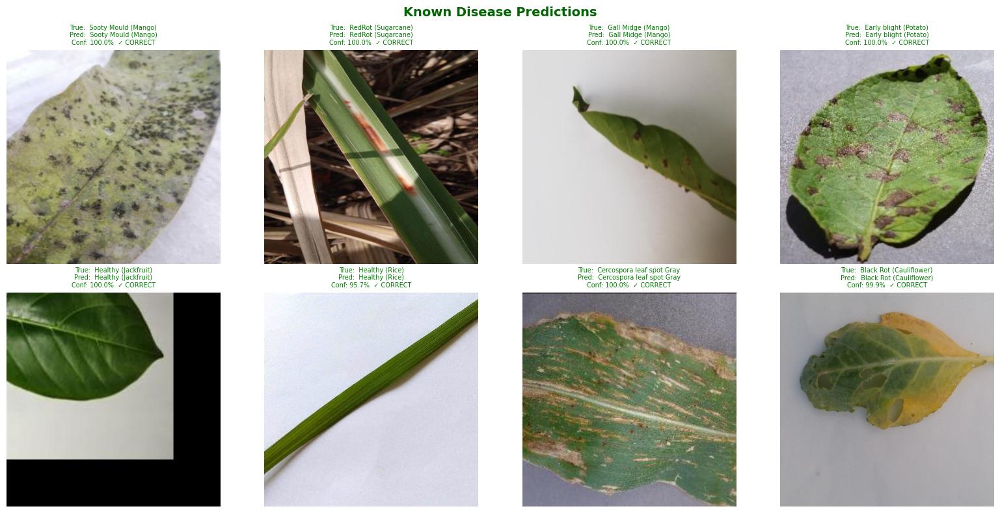

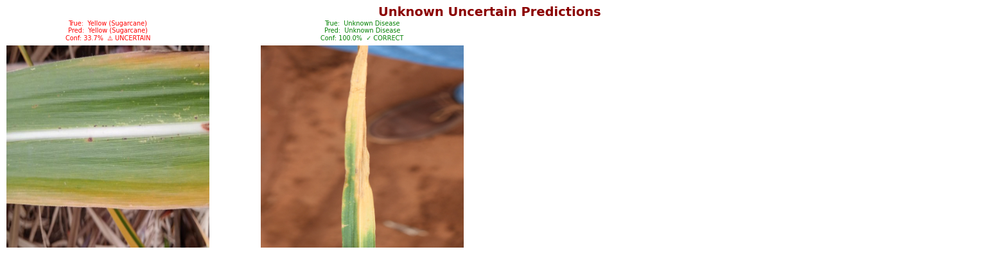


========== PREDICTION SUMMARY ==========
Confidence threshold for "unknown": 50%

Running full val set evaluation...

Total val images:        4,275
High-confidence (≥50%): 4,201 (98.3%)
Low-confidence  (<50%): 74 (1.7%)

Overall accuracy:        95.27%
Known-only accuracy:     96.10%


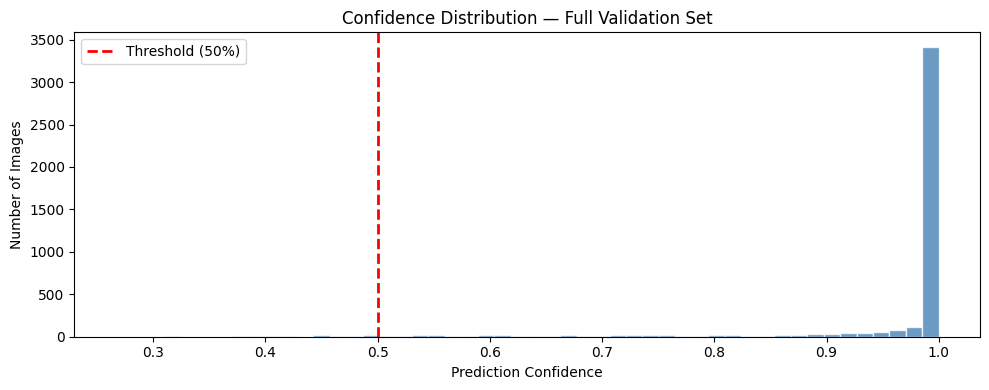

In [18]:
# ============================================================
# CELL 16 — Prediction Demo: Known & Unknown Disease Detection
# ============================================================

import glob as glob_module

CONFIDENCE_THRESHOLD = 0.5
NUM_SAMPLES_PER_GROUP = 8

def predict_image(img_path, model, class_names, threshold=CONFIDENCE_THRESHOLD):
    img = cv2.imread(str(img_path))
    if img is None:
        return None, 0.0, True, None
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (CFG['img_size'], CFG['img_size']))
    inp = tf.keras.applications.efficientnet.preprocess_input(
        tf.cast(img_resized, tf.float32))
    inp = tf.expand_dims(inp, 0)
    logits = best_model.predict(inp, verbose=0)
    probs     = tf.nn.softmax(logits[0]).numpy()
    top_idx   = np.argmax(probs)
    top_conf  = probs[top_idx]
    top_label = class_names[top_idx]
    is_uncertain = top_conf < threshold
    return top_label, top_conf, is_uncertain, img_resized


def plot_group(samples, title, fig_title_color):
    n = len(samples)
    if n == 0:
        print(f'No samples found for: {title}')
        return
    cols = 4
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = np.array(axes).reshape(-1)
    fig.suptitle(title, fontsize=14, color=fig_title_color, fontweight='bold')

    for i, (img, true_lbl, pred_lbl, conf, uncertain) in enumerate(samples):
        ax = axes[i]
        ax.imshow(img)
        color = 'red' if uncertain else ('green' if true_lbl.lower() in pred_lbl.lower() else 'orange')
        status = '⚠ UNCERTAIN' if uncertain else ('✓ CORRECT' if true_lbl.lower() in pred_lbl.lower() else '✗ WRONG')
        ax.set_title(
            f'True:  {true_lbl}\nPred:  {pred_lbl}\nConf: {conf*100:.1f}%  {status}',
            fontsize=7, color=color
        )
        for spine in ax.spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
        ax.axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    safe_title = title.replace(" ", "_").replace("/", "_").lower()
    plt.savefig(os.path.join(CFG['save_dir'], f'{safe_title}.png'), dpi=120)
    plt.show()


# ── Collect sample images from val set ──────────────────────
val_path = Path(CFG['val_dir'])
known_samples   = []
unknown_samples = []

all_classes = CFG['class_names']
unknown_class_name = next((c for c in all_classes if 'unknown' in c.lower()), None)
print(f'Unknown class in dataset: {unknown_class_name}')

random.seed(99)
for cls in random.sample(all_classes, len(all_classes)):
    imgs = glob_module.glob(str(val_path / cls / '*'))
    imgs = [p for p in imgs if p.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not imgs:
        continue
    img_path = random.choice(imgs)
    result = predict_image(img_path, best_model, all_classes)
    if result[0] is None:
        continue
    pred_label, confidence, is_uncertain, img_rgb = result
    true_label = cls.split('___')[-1].replace('_', ' ')[:25]
    pred_short  = pred_label.split('___')[-1].replace('_', ' ')[:25]
    entry = (img_rgb, true_label, pred_short, confidence, is_uncertain)

    if cls == unknown_class_name or is_uncertain:
        if len(unknown_samples) < NUM_SAMPLES_PER_GROUP:
            unknown_samples.append(entry)
    else:
        if len(known_samples) < NUM_SAMPLES_PER_GROUP:
            known_samples.append(entry)

    if len(known_samples) >= NUM_SAMPLES_PER_GROUP and \
       len(unknown_samples) >= NUM_SAMPLES_PER_GROUP:
        break

plot_group(known_samples,   'Known Disease Predictions',      'darkgreen')
plot_group(unknown_samples, 'Unknown Uncertain Predictions',  'darkred')

# ── Summary stats ────────────────────────────────────────────
print('\n========== PREDICTION SUMMARY ==========')
print(f'Confidence threshold for "unknown": {CONFIDENCE_THRESHOLD*100:.0f}%')

print('\nRunning full val set evaluation...')
y_true_all, y_pred_all, y_conf_all = [], [], []

for x_batch, y_batch in val_ds:
    logits = best_model.predict_on_batch(x_batch)
    probs  = tf.nn.softmax(logits).numpy()
    y_pred_all.extend(np.argmax(probs, axis=1))
    y_conf_all.extend(np.max(probs, axis=1))
    y_true_all.extend(y_batch.numpy())

y_true_all = np.array(y_true_all)
y_pred_all = np.array(y_pred_all)
y_conf_all = np.array(y_conf_all)

known_mask  = y_conf_all >= CONFIDENCE_THRESHOLD
unknown_mask = ~known_mask

known_acc   = accuracy_score(y_true_all[known_mask], y_pred_all[known_mask]) if known_mask.sum() > 0 else 0
overall_acc = accuracy_score(y_true_all, y_pred_all)

print(f'\nTotal val images:        {len(y_true_all):,}')
print(f'High-confidence (≥{CONFIDENCE_THRESHOLD*100:.0f}%): {known_mask.sum():,} ({known_mask.mean()*100:.1f}%)')
print(f'Low-confidence  (<{CONFIDENCE_THRESHOLD*100:.0f}%): {unknown_mask.sum():,} ({unknown_mask.mean()*100:.1f}%)')
print(f'\nOverall accuracy:        {overall_acc*100:.2f}%')
print(f'Known-only accuracy:     {known_acc*100:.2f}%')

# Confidence distribution plot
plt.figure(figsize=(10, 4))
plt.hist(y_conf_all, bins=50, color='steelblue', edgecolor='white', alpha=0.8)
plt.axvline(CONFIDENCE_THRESHOLD, color='red', linestyle='--', linewidth=2,
            label=f'Threshold ({CONFIDENCE_THRESHOLD*100:.0f}%)')
plt.xlabel('Prediction Confidence')
plt.ylabel('Number of Images')
plt.title('Confidence Distribution — Full Validation Set')
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(CFG['save_dir'], 'confidence_distribution.png'), dpi=120)
plt.show()